In [12]:
import pandas            as pd 
import numpy             as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn           as sns
import scipy.stats       as stats
from scipy.stats import shapiro


%matplotlib inline 

import sys
import warnings
warnings.filterwarnings("ignore")

# to visualise al the columns in the dataframe
pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

In [3]:
# check scikit-learn version
import sklearn
print(sklearn.__version__)

import sys
print(sys.version)

1.3.0
3.11.4 | packaged by Anaconda, Inc. | (main, Jul  5 2023, 13:38:37) [MSC v.1916 64 bit (AMD64)]


## Defining functions for EDA Tasks

In [56]:
# builtin function for distribution of target variable
def distribution_of_target(df):
    count=df["TARGET"].value_counts()
    count
    
    # Percentage calculation
    print("Percentage: ")
    print((df["TARGET"].value_counts()/df["TARGET"].count())*100)

    # Create a pie plot
    plt.figure(figsize=(4, 4),tight_layout=True)
    plt.pie(count, labels=["Non-Defaulter","Defaulter"], autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)

    # Add a title
    plt.title('Pie Plot for Target')
    
# Plot distribution of one feature (continuous)
def plot_distribution(data,feature,color):
    
    plt.figure(figsize=(12,4))
    plt.title(f"Distribution of {feature}s")
    sns.distplot(data[feature].dropna(),color=color, kde=True,bins=100)
    
    # Calculate basic statistics
    
    mean_value = np.mean(data[feature])
    median_value = np.median(data[feature].dropna())
    skewness = data[feature].skew()
    kurtosis = data[feature].kurt()
    
    # Print summary
    print("Feature:",feature,"\n")
       
    print(f"range{min(data[feature]),max(data[feature])}")
    print(f"Mean: {mean_value}")
    print(f"Median: {median_value}")
    print(f"Skewness: {skewness}")
    print(f"Kurtosis: {kurtosis}")
    
    print("")
    
    if skewness > -0.5 and skewness < 0.5:
        print("The distribution is approximately symmetric.")
    elif skewness <= -0.5:
        print("The distribution is negatively skewed (skewed to the left).")
    elif skewness >= 0.5:
        print("The distribution is positively skewed (skewed to the right).")
    
    if kurtosis == 3:
        print("The kurtosis is similar to that of a normal distribution.")
    elif kurtosis < 3:
        print("The distribution has lighter tails (less extreme values).")
    elif kurtosis > 3:
        print("The distribution has heavier tails (more extreme values).")
    
    plt.tight_layout()
    plt.show()

# normal distribution check
def normal_distribution_check(data):
    print("\nNormal Distribution Check: \n")
    
    statistic, p_value = shapiro(data)
    
    print(f"Test Statistic: {statistic}, P-value: {p_value}")

    if p_value > 0.05:
        print("Fail to reject the null hypothesis (data may be normally distributed)")
    else:
        print("Reject the null hypothesis (data may not be normally distributed)\n")
        
# Function to plot KDE and Box plots side by side
def plot_kde_and_box(data, feature):

    sns.set(style="whitegrid")

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))
    
    # KDE plot
    sns.kdeplot(data.loc[data['TARGET'] == 0, feature], label = 'Target == 0', shade=True, ax=axes[0])
    sns.kdeplot(data.loc[data['TARGET'] == 1, feature], label = 'Target == 1', shade=True, ax=axes[0])
    
    axes[0].set_title(f'Distribution of {feature} by TARGET')
    axes[0].set_xlabel(feature)
    axes[0].set_ylabel('Density')
    axes[0].legend()
    
    # box plot
    sns.boxplot(x="TARGET", y=feature, data=data, palette="Set3", ax=axes[1])
    
    axes[1].set_title(f"{feature} Box Plot")
    axes[1].set_xlabel("TARGET")
    axes[1].set_ylabel(feature)

    plt.tight_layout()
    plt.show()

## Data Loading

In [5]:
df = pd.read_csv("Cleaned_housing_loan_data.csv", encoding = 'Latin-1')

In [6]:
df.head()

,AMT_ANNUITY,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,EXT_SOURCE_2,EXT_SOURCE_3,PA_AMT_CREDIT_sum,PA_DAYS_DECISION_max_y,IP_DAYS_INSTALMENT_min,IP_AMT_INSTALMENT_sum,IP_AMT_INSTALMENT_avg,AT_CREDIT_INCOME_PERCENT,AT_ANNUITY_INCOME_PERCENT,AT_CREDIT_TERM,AT_DAYS_EMPLOYED_PERCENT,TARGET
0,24700.5,-9461,-3648.0,-2120,0.262949,0.139376,179055.000,-606.0,-565.0,219625.695,11559.247105,2.007889,0.121978,0.060749,0.067329,1
1,35698.5,-16765,-1186.0,-291,0.622246,0.535276,1452573.000,-746.0,-2310.0,1618864.650,40846.839311,4.790750,0.132217,0.027598,0.070862,0
2,6750.0,-19046,-4260.0,-2531,0.555912,0.729567,20106.000,-815.0,-784.0,21288.465,7096.155000,2.000000,0.100000,0.050000,0.011814,0
3,29686.5,-19005,-9833.0,-2437,0.650442,0.535276,2530189.125,-181.0,-545.0,1007153.415,40846.839311,2.316167,0.219900,0.094941,0.159905,0
4,21865.5,-19932,-4311.0,-3458,0.322738,0.535276,999832.500,-374.0,-2326.0,835985.340,12666.444545,4.222222,0.179963,0.042623,0.152418,0


## Converting features which represents no of days in negative values into years

In [7]:
df["DAYS_BIRTH"] = (df["DAYS_BIRTH"]/365*-1)
df["DAYS_REGISTRATION"] = (df["DAYS_REGISTRATION"]/365*-1)
df["DAYS_ID_PUBLISH"] = (df["DAYS_ID_PUBLISH"]/365*-1)
df["PA_DAYS_DECISION_max_y"] = (df["PA_DAYS_DECISION_max_y"]/365*-1)
df["IP_DAYS_INSTALMENT_min"] = (df["IP_DAYS_INSTALMENT_min"]/365*-1)

In [8]:
df.head()

,AMT_ANNUITY,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,EXT_SOURCE_2,EXT_SOURCE_3,PA_AMT_CREDIT_sum,PA_DAYS_DECISION_max_y,IP_DAYS_INSTALMENT_min,IP_AMT_INSTALMENT_sum,IP_AMT_INSTALMENT_avg,AT_CREDIT_INCOME_PERCENT,AT_ANNUITY_INCOME_PERCENT,AT_CREDIT_TERM,AT_DAYS_EMPLOYED_PERCENT,TARGET
0,24700.5,25.920548,9.994521,5.808219,0.262949,0.139376,179055.000,1.660274,1.547945,219625.695,11559.247105,2.007889,0.121978,0.060749,0.067329,1
1,35698.5,45.931507,3.249315,0.797260,0.622246,0.535276,1452573.000,2.043836,6.328767,1618864.650,40846.839311,4.790750,0.132217,0.027598,0.070862,0
2,6750.0,52.180822,11.671233,6.934247,0.555912,0.729567,20106.000,2.232877,2.147945,21288.465,7096.155000,2.000000,0.100000,0.050000,0.011814,0
3,29686.5,52.068493,26.939726,6.676712,0.650442,0.535276,2530189.125,0.495890,1.493151,1007153.415,40846.839311,2.316167,0.219900,0.094941,0.159905,0
4,21865.5,54.608219,11.810959,9.473973,0.322738,0.535276,999832.500,1.024658,6.372603,835985.340,12666.444545,4.222222,0.179963,0.042623,0.152418,0


## Data summary

In [9]:
print("This are the dimensions of our data:\n")
print(df.shape,"\n")
print("Columns in our dataset:\n")
print(df.columns.values,"\n")
print("Count of data types:\n")
print(df.dtypes.value_counts(),"\n")
print("No of object features: ",len(df.select_dtypes('object').columns))


This are the dimensions of our data:

(307511, 16) 

Columns in our dataset:

['AMT_ANNUITY' 'DAYS_BIRTH' 'DAYS_REGISTRATION' 'DAYS_ID_PUBLISH'
 'EXT_SOURCE_2' 'EXT_SOURCE_3' 'PA_AMT_CREDIT_sum'
 'PA_DAYS_DECISION_max_y' 'IP_DAYS_INSTALMENT_min' 'IP_AMT_INSTALMENT_sum'
 'IP_AMT_INSTALMENT_avg' 'AT_CREDIT_INCOME_PERCENT'
 'AT_ANNUITY_INCOME_PERCENT' 'AT_CREDIT_TERM' 'AT_DAYS_EMPLOYED_PERCENT'
 'TARGET'] 

Count of data types:

float64    15
int64       1
dtype: int64 

No of object features:  0


## Analysis of Target variable

TARGET value 0 means loan is repayed, value 1 means loan is not repayed.

Percentage: 
0    91.927118
1     8.072882
Name: TARGET, dtype: float64


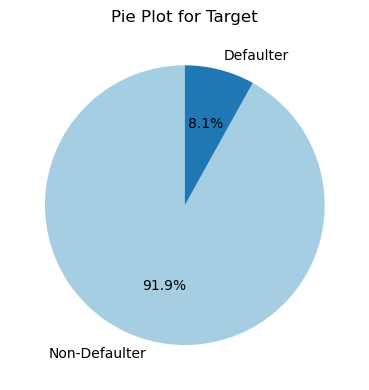

In [9]:
print("TARGET value 0 means loan is repayed, value 1 means loan is not repayed.\n")
distribution_of_target(df)

### Observations :
From the distribution of Target variable, one thing that we know found out is the Data Imbalance. There are only 8.07% of the total loans that had actually been Defaulted. This means that Defaulters is the minority class.

On the other hand, there are 91.9% loans which were not Defaulted. Thus, Non-Defaulters will be our majority class.

The Defaulters have been assigned a Target variable of 1 and Non-Defaulters have been assigned Target Variable 0.

## Uni-variate analysis

### Distribution of continuous features

In [58]:
df.columns

Index(['AMT_ANNUITY', 'DAYS_BIRTH', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'PA_AMT_CREDIT_sum',
       'PA_DAYS_DECISION_max_y', 'IP_DAYS_INSTALMENT_min',
       'IP_AMT_INSTALMENT_sum', 'IP_AMT_INSTALMENT_avg',
       'AT_CREDIT_INCOME_PERCENT', 'AT_ANNUITY_INCOME_PERCENT',
       'AT_CREDIT_TERM', 'AT_DAYS_EMPLOYED_PERCENT', 'TARGET'],
      dtype='object')

### Feature 1 : AMT_ANNUITY

Feature: AMT_ANNUITY 

range(1615.5, 61704.0)
Mean: 26797.65715047592
Median: 24903.0
Skewness: 0.7052955632943193
Kurtosis: -0.01483536845577138

The distribution is positively skewed (skewed to the right).
The distribution has lighter tails (less extreme values).


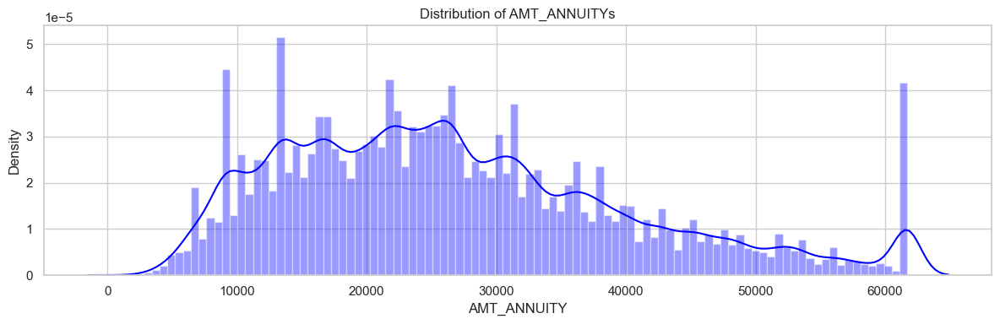


Normal Distribution Check: 

Test Statistic: 0.9544115662574768, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



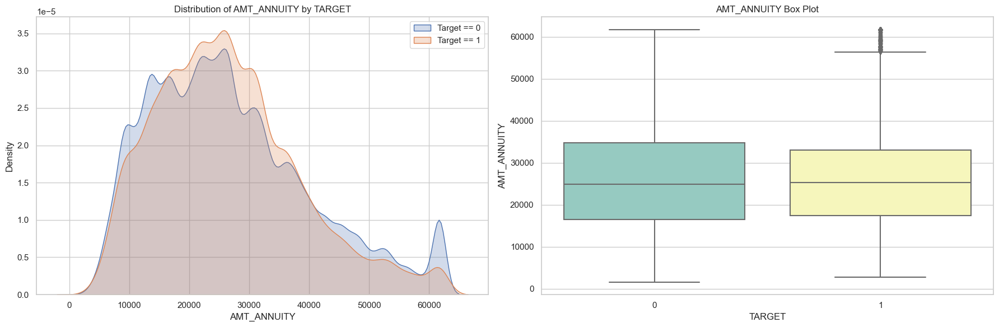

In [57]:
plot_distribution(df,"AMT_ANNUITY" ,"blue")
normal_distribution_check(df["AMT_ANNUITY"])
plot_kde_and_box(df,'AMT_ANNUITY')

### Feature 2 : DAYS_BIRTH

Feature: DAYS_BIRTH 

range(20.517808219178082, 69.12054794520547)
Mean: 43.93697278587162
Median: 43.15068493150685
Skewness: 0.11567331170165937
Kurtosis: -1.0491257699460343

The distribution is approximately symmetric.
The distribution has lighter tails (less extreme values).


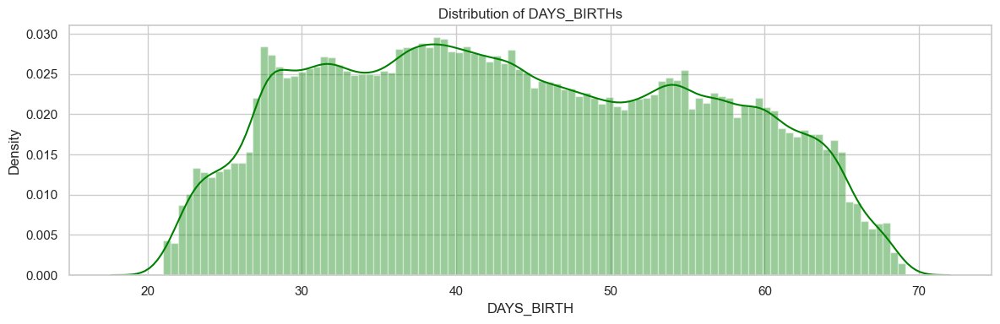


Normal Distribution Check: 

Test Statistic: 0.969713568687439, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



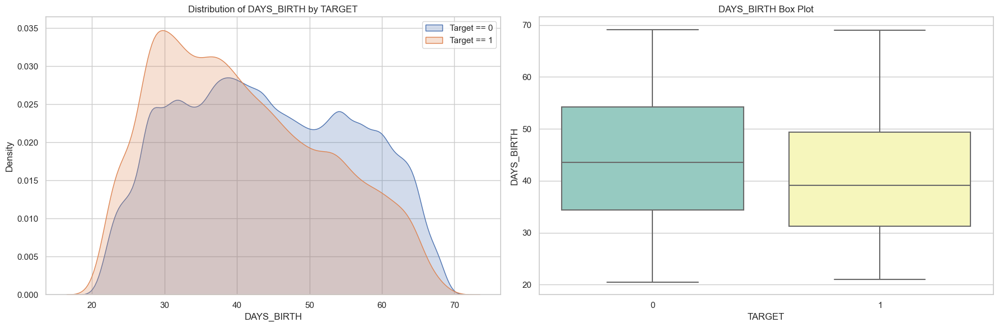

In [59]:
plot_distribution(df,"DAYS_BIRTH" ,"green")
normal_distribution_check(df["DAYS_BIRTH"])
plot_kde_and_box(df,'DAYS_BIRTH')

### Observations :

From the above two plots, we can draw some important insights.

1.From the distplot, we can observe the peak of Age of people who Default to be close to 30 years. Also, at this point, the Non-Defaulters have a quite smaller PDF. One more thing to note is that the PDF of Age for Defaulters starts a bit left from the Non-Defaulters This means that the Defaulters are usually younger than Non-Defaulters.

2.From the box-plot too, we can better visualize the same thing. The Age of Defaulters is usually lesser than the Non-Defaulters. All the quantiles of ages of Defaulters is lesser than Non-Defaulters. The 75th percentile value of Non-Defaulters is around 54 years while for Defaulters it is near to 49 years.

3.These observations imply that the Defaulters are usually younger than Non-Defaulters.

4.Data looks Normally distributed.

### Feature 3 : DAYS_REGISTRATION

Feature: DAYS_REGISTRATION 

range(-0.0, 42.96917808219178)
Mean: 13.653458974530652
Median: 12.33972602739726
Skewness: 0.57096075986583
Kurtosis: -0.4181485962742797

The distribution is positively skewed (skewed to the right).
The distribution has lighter tails (less extreme values).


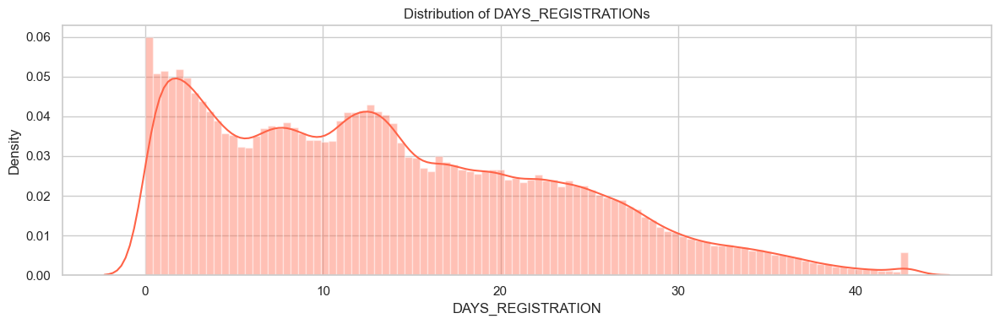


Normal Distribution Check: 

Test Statistic: 0.9535525441169739, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



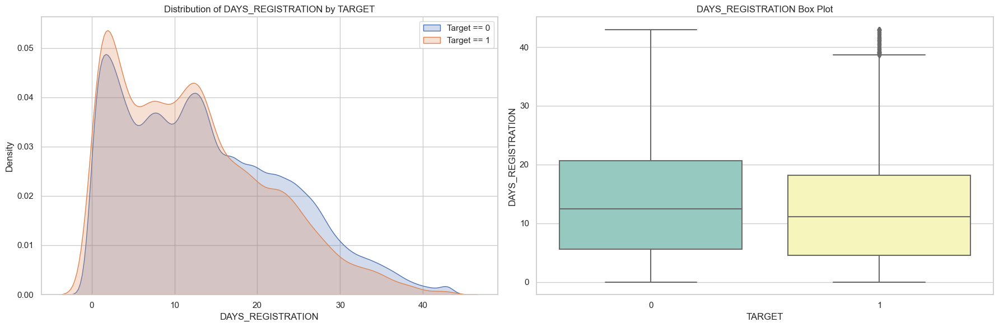

In [61]:
plot_distribution(df,"DAYS_REGISTRATION" ,"tomato")
normal_distribution_check(df["DAYS_REGISTRATION"])
plot_kde_and_box(df,'DAYS_REGISTRATION')

### Observation:

1.Data is positively skewed. so it's not normally distributed.

2.PDF for people who have new registration is a bit higher for defaulter than the PDF for defaulter.And opposite 
to that for people who have old registration tend to less possibility for defaulting. They have higher PDF compared to the ones 
for defaulter.

3.Difference in distribution of two categories of dependent feature is not that significant though.


### Feature 4 : DAYS_REGISTRATION

Feature: DAYS_ID_PUBLISH 

range(-0.0, 19.71780821917808)
Mean: 8.203294173283387
Median: 8.915068493150685
Skewness: -0.349327493202997
Kurtosis: -1.1068078939970998

The distribution is approximately symmetric.
The distribution has lighter tails (less extreme values).


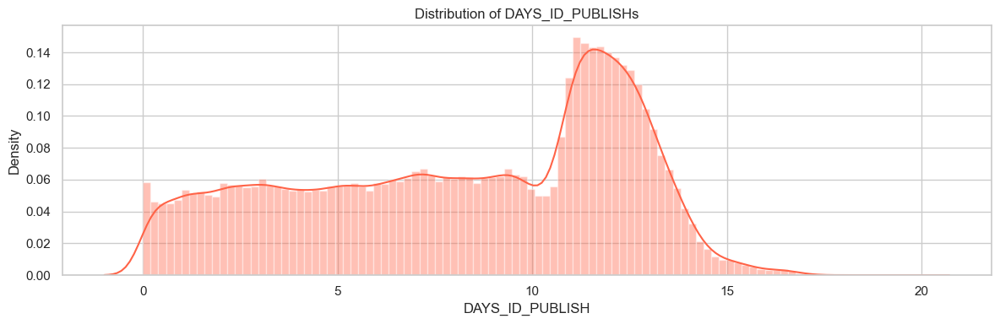


Normal Distribution Check: 

Test Statistic: 0.9414174556732178, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



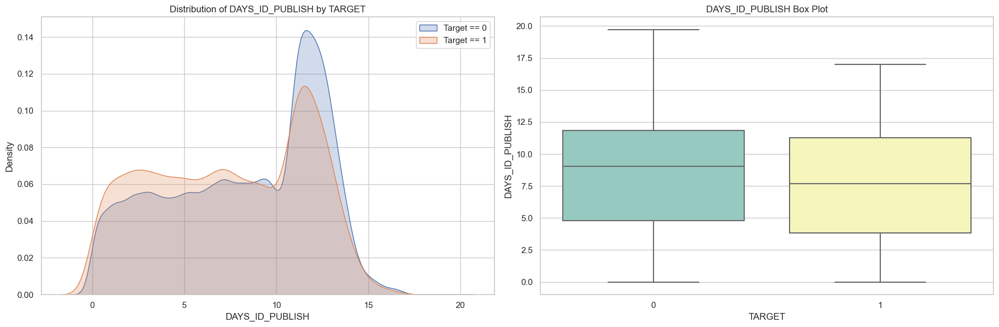

In [62]:
plot_distribution(df,"DAYS_ID_PUBLISH" ,"tomato")
normal_distribution_check(df["DAYS_ID_PUBLISH"])
plot_kde_and_box(df,'DAYS_ID_PUBLISH')

### Feature 5 : EXT_SOURCE_2

Feature: EXT_SOURCE_2 

range(8.173616518884397e-08, 0.8549996664047012)
Mean: 0.514503354322039
Median: 0.5659614260608526
Skewness: -0.7959400362910248
Kurtosis: -0.26225703458375627

The distribution is negatively skewed (skewed to the left).
The distribution has lighter tails (less extreme values).


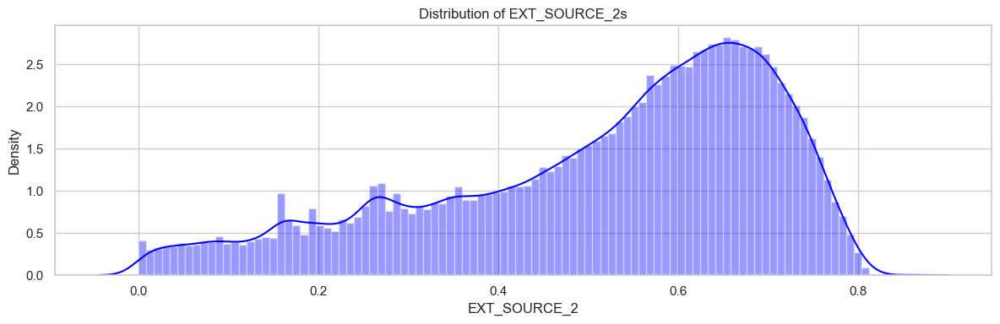


Normal Distribution Check: 

Test Statistic: 0.9266524910926819, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



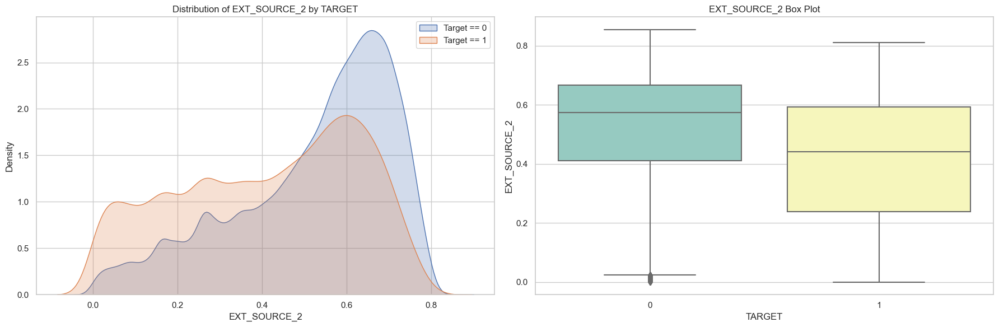

In [63]:
plot_distribution(df,"EXT_SOURCE_2" ,"blue")
normal_distribution_check(df["EXT_SOURCE_2"])
plot_kde_and_box(df,'EXT_SOURCE_2')

### Observation:

1.If we look at the box-plots, we see a trend , which is that the Defaulters tend to have considerably lower values.

2.This trend can also be seen with the PDFs. The Non-Defaulters show a higher peak at high EXT_SOURCE values, and the Probability Densities are very low for low values. This implies that Non-Defaulters generally have high values of these scores.

3.It is interesting to note that the median value for defaulters is almost equal to or lower than 25th percentile values of Non-Defaulters.

### Feature 6 : EXT_SOURCE_3

Feature: EXT_SOURCE_3 

range(0.0881849140014582, 0.8960095494948396)
Mean: 0.5162159541524743
Median: 0.5352762504724826
Skewness: -0.496494400551036
Kurtosis: -0.17167708906450407

The distribution is approximately symmetric.
The distribution has lighter tails (less extreme values).


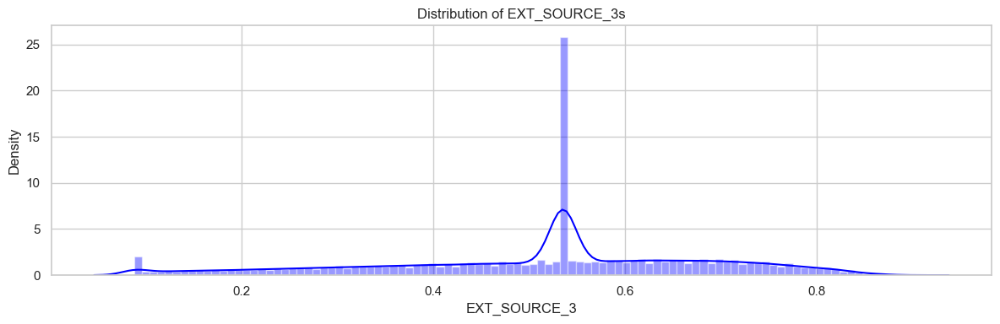


Normal Distribution Check: 

Test Statistic: 0.9266524910926819, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



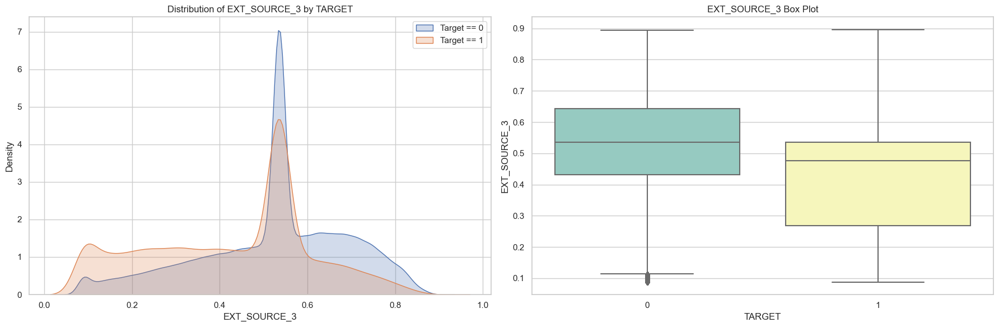

In [86]:
plot_distribution(df,"EXT_SOURCE_3" ,"blue")
normal_distribution_check(df["EXT_SOURCE_2"])
plot_kde_and_box(df,'EXT_SOURCE_3')

### Observation:

1.Most of the data for defaulter is in between 25th percentile to the 50th percentile.

2.So, It seems that the defaulter tends to have lower ext_source_3 values compared to the non-defaulter, oppositely people with
high ext_source_3 value tends to be more Non-Defaulter,they have high PMF compared to the Defaulter

3.It is interesting to note that the median value for defaulters is almost equal to or lower than 25th percentile values of Non-Defaulters.

### Feature 7 : PA_AMT_CREDIT_sum

Feature: PA_AMT_CREDIT_sum 

range(0.0, 2530189.125)
Mean: 732001.7228933439
Median: 383778.0
Skewness: 1.188010215691167
Kurtosis: 0.12943498629996641

The distribution is positively skewed (skewed to the right).
The distribution has lighter tails (less extreme values).


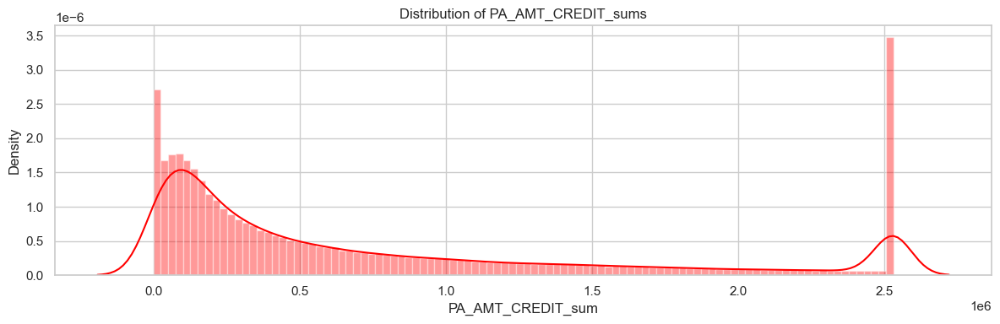


Normal Distribution Check: 

Test Statistic: 0.7997277975082397, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



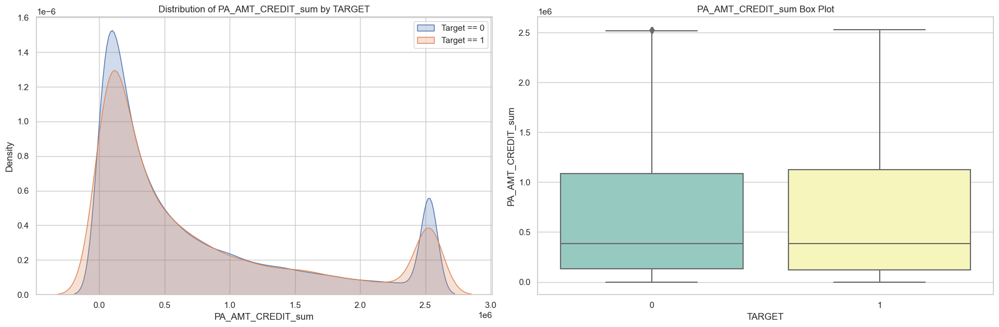

In [87]:
plot_distribution(df,"PA_AMT_CREDIT_sum" ,"red")
normal_distribution_check(df["PA_AMT_CREDIT_sum"])
plot_kde_and_box(df,'PA_AMT_CREDIT_sum')

### Feature 8 : PA_DAYS_DECISION_max_y

Feature: PA_DAYS_DECISION_max_y 

range(-0.0, 3.3917808219178083)
Mean: 1.0876207346274689
Median: 0.7643835616438356
Skewness: 1.0780672548359727
Kurtosis: 0.13988562230329427

The distribution is positively skewed (skewed to the right).
The distribution has lighter tails (less extreme values).


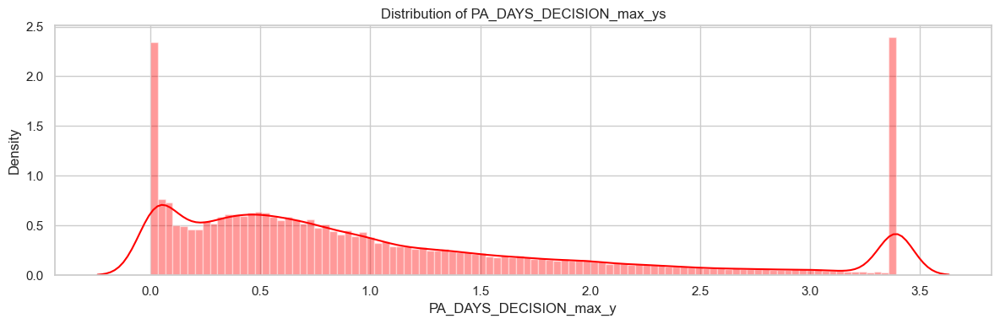


Normal Distribution Check: 

Test Statistic: 0.8595461845397949, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



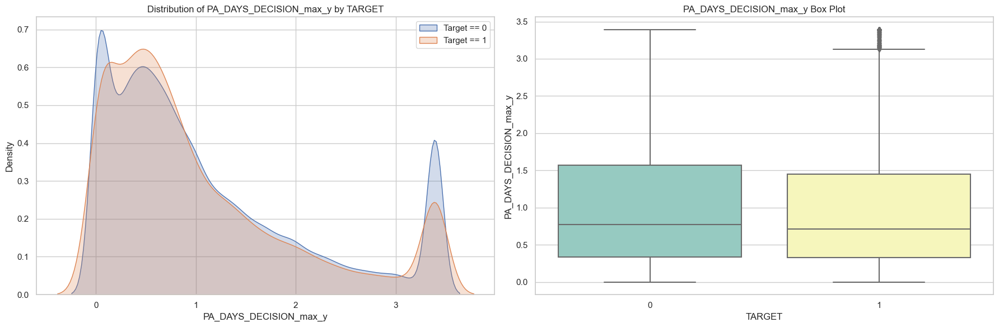

In [89]:
plot_distribution(df,"PA_DAYS_DECISION_max_y" ,"red")
normal_distribution_check(df["PA_DAYS_DECISION_max_y"])
plot_kde_and_box(df,'PA_DAYS_DECISION_max_y')

### Feature 9 : IP_DAYS_INSTALMENT_min

Feature: IP_DAYS_INSTALMENT_min 

range(-0.0, 8.005479452054795)
Mean: 4.118256261954411
Median: 3.9726027397260273
Skewness: 0.053603140858422445
Kurtosis: -1.4028406446449095

The distribution is approximately symmetric.
The distribution has lighter tails (less extreme values).


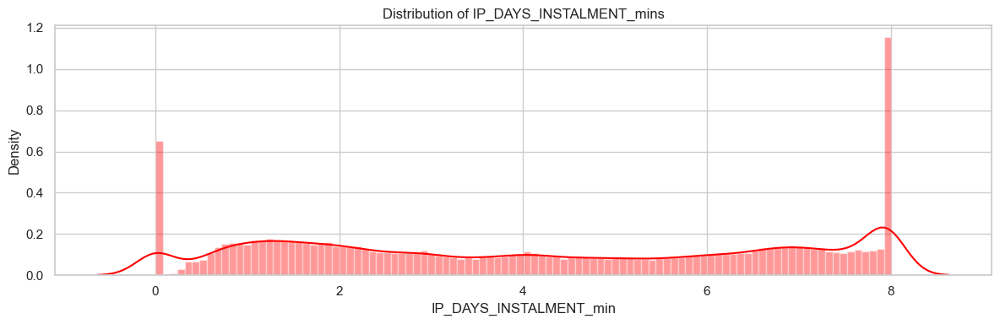


Normal Distribution Check: 

Test Statistic: 0.9224629402160645, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



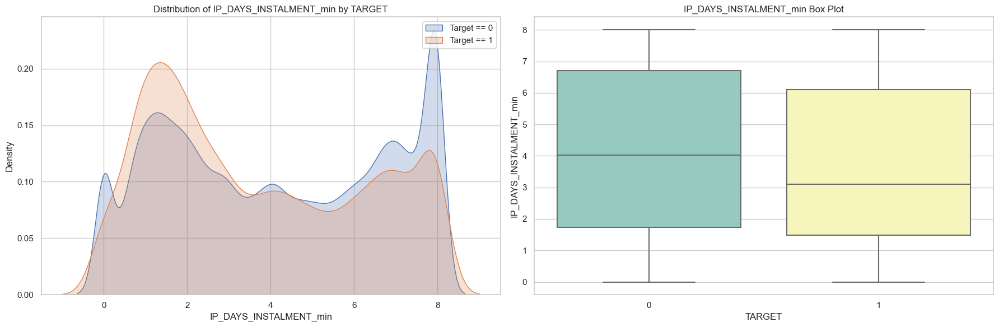

In [90]:
plot_distribution(df,"IP_DAYS_INSTALMENT_min" ,"red")
normal_distribution_check(df["IP_DAYS_INSTALMENT_min"])
plot_kde_and_box(df,'IP_DAYS_INSTALMENT_min')

### Feature 10 : IP_AMT_INSTALMENT_sum

Feature: IP_AMT_INSTALMENT_sum 

range(0.0, 1818985.51125)
Mean: 543334.2322228838
Median: 298091.745
Skewness: 1.1742283288916773
Kurtosis: 0.08629468062059642

The distribution is positively skewed (skewed to the right).
The distribution has lighter tails (less extreme values).


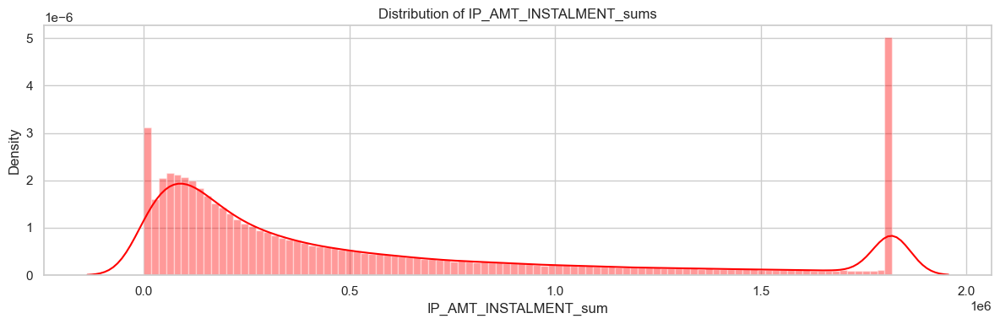


Normal Distribution Check: 

Test Statistic: 0.8042486906051636, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



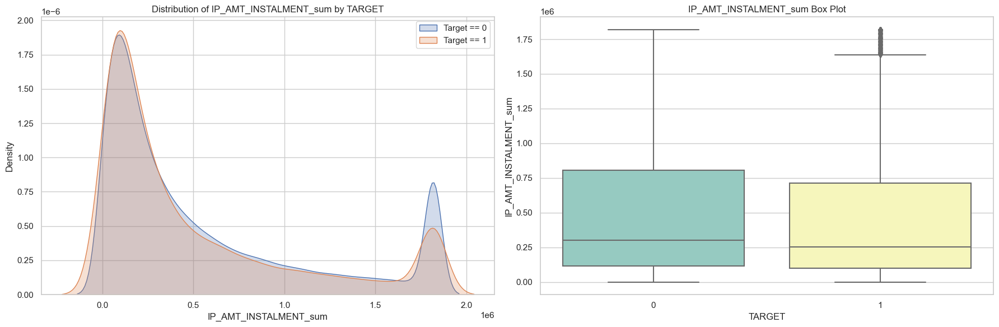

In [91]:
plot_distribution(df,"IP_AMT_INSTALMENT_sum" ,"red")
normal_distribution_check(df["IP_AMT_INSTALMENT_sum"])
plot_kde_and_box(df,'IP_AMT_INSTALMENT_sum')

### Feature 11 : IP_AMT_INSTALMENT_avg

Feature: IP_AMT_INSTALMENT_avg 

range(0.0, 40846.83931074609)
Mean: 15268.250409622548
Median: 11954.42052631579
Skewness: 0.971372867048393
Kurtosis: 0.03404946116736918

The distribution is positively skewed (skewed to the right).
The distribution has lighter tails (less extreme values).


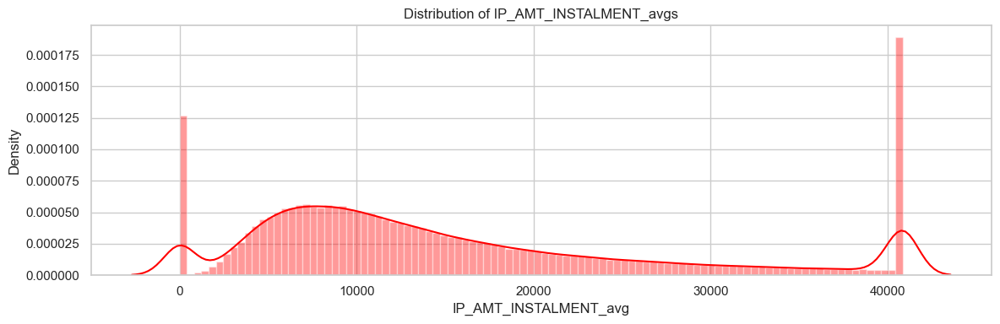


Normal Distribution Check: 

Test Statistic: 0.8899738788604736, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



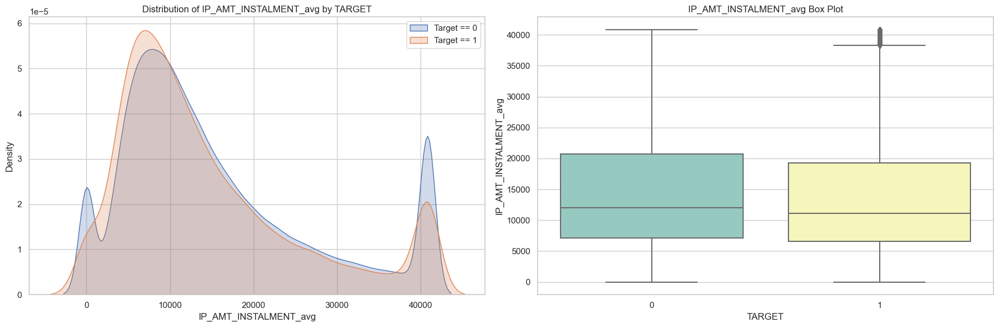

In [92]:
plot_distribution(df,"IP_AMT_INSTALMENT_avg" ,"red")
normal_distribution_check(df["IP_AMT_INSTALMENT_avg"])
plot_kde_and_box(df,'IP_AMT_INSTALMENT_avg')

### Feature 12 : AT_CREDIT_INCOME_PERCENT

Feature: AT_CREDIT_INCOME_PERCENT 

range(0.0048076153846153, 9.8717)
Mean: 3.8662867481065484
Median: 3.265066666666667
Skewness: 0.9194828088278874
Kurtosis: 0.11675594723929361

The distribution is positively skewed (skewed to the right).
The distribution has lighter tails (less extreme values).


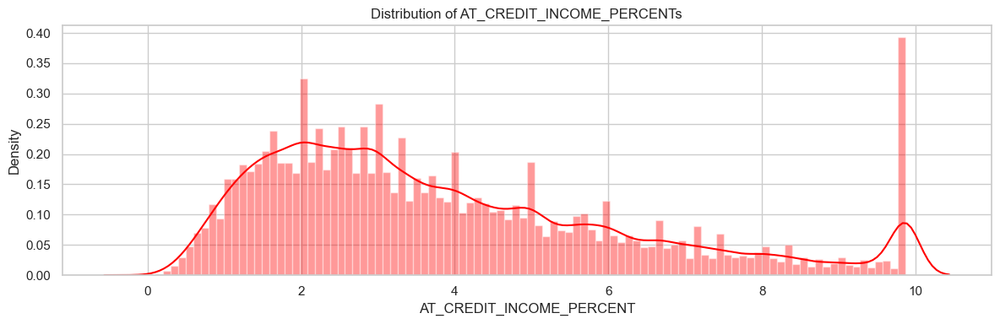


Normal Distribution Check: 

Test Statistic: 0.9170345067977905, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



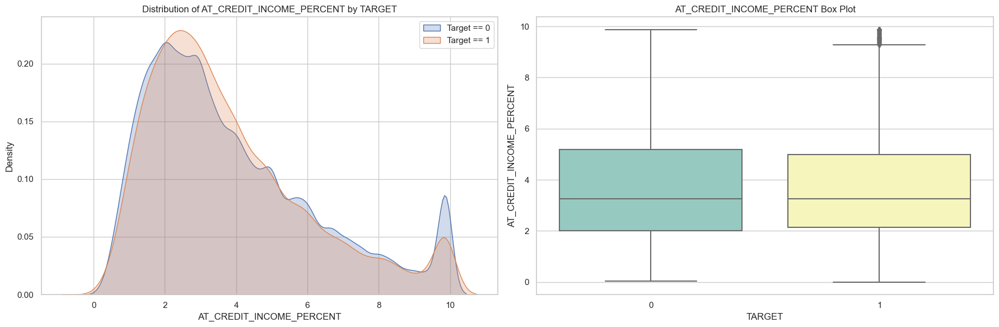

In [93]:
plot_distribution(df,"AT_CREDIT_INCOME_PERCENT" ,"red")
normal_distribution_check(df["AT_CREDIT_INCOME_PERCENT"])
plot_kde_and_box(df,'AT_CREDIT_INCOME_PERCENT')

### Feature 13 : AT_ANNUITY_INCOME_PERCENT

Feature: AT_ANNUITY_INCOME_PERCENT 

range(0.0002238846153846, 0.4004933465085639)
Mean: 0.17852984607901592
Median: 0.1628333333333333
Skewness: 0.7315224399670462
Kurtosis: 0.02822589039734824

The distribution is positively skewed (skewed to the right).
The distribution has lighter tails (less extreme values).


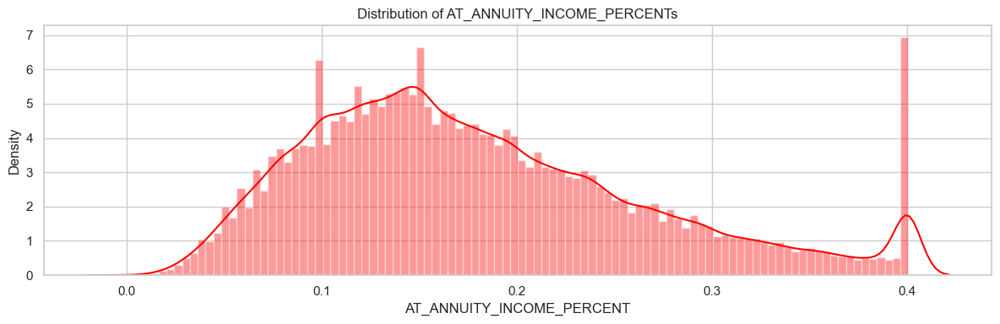


Normal Distribution Check: 

Test Statistic: 0.9527530670166016, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



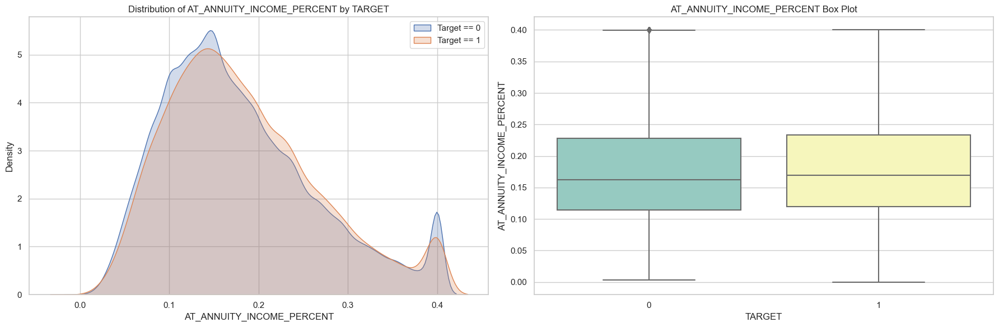

In [94]:
plot_distribution(df,"AT_ANNUITY_INCOME_PERCENT" ,"red")
normal_distribution_check(df["AT_ANNUITY_INCOME_PERCENT"])
plot_kde_and_box(df,'AT_ANNUITY_INCOME_PERCENT')

### Feature 14 : AT_CREDIT_TERM

Feature: AT_CREDIT_TERM 

range(0.0167896919664934, 0.104757286539928)
Mean: 0.05342046374995428
Median: 0.05
Skewness: 1.013099761866254
Kurtosis: 0.17425701035348684

The distribution is positively skewed (skewed to the right).
The distribution has lighter tails (less extreme values).


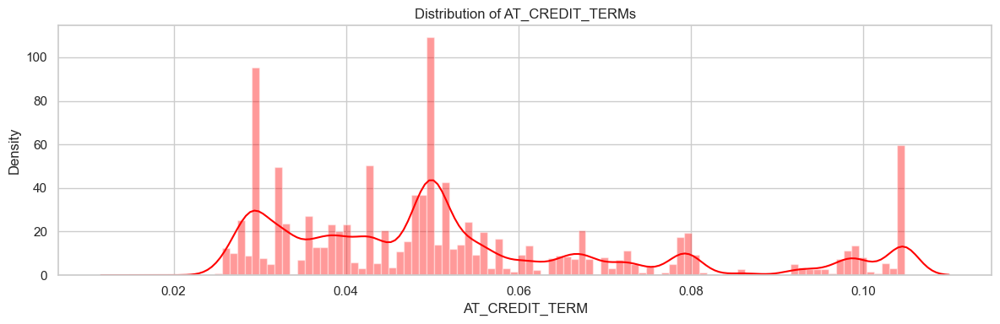


Normal Distribution Check: 

Test Statistic: 0.8821279406547546, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



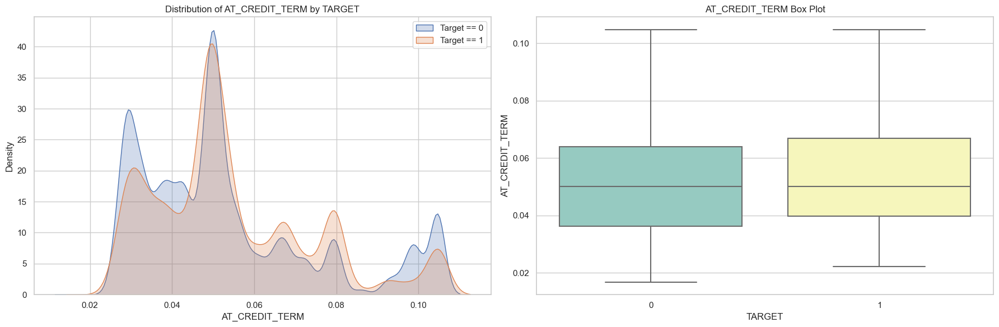

In [95]:
plot_distribution(df,"AT_CREDIT_TERM" ,"red")
normal_distribution_check(df["AT_CREDIT_TERM"])
plot_kde_and_box(df,'AT_CREDIT_TERM')

### Feature 15 : AT_DAYS_EMPLOYED_PERCENT

Feature: AT_DAYS_EMPLOYED_PERCENT 

range(-0.2326042597887122, 0.4451632385118899)
Mean: 0.08310172692683537
Median: 0.088644630713269
Skewness: -0.23893655209212655
Kurtosis: -0.32722417658854575

The distribution is approximately symmetric.
The distribution has lighter tails (less extreme values).


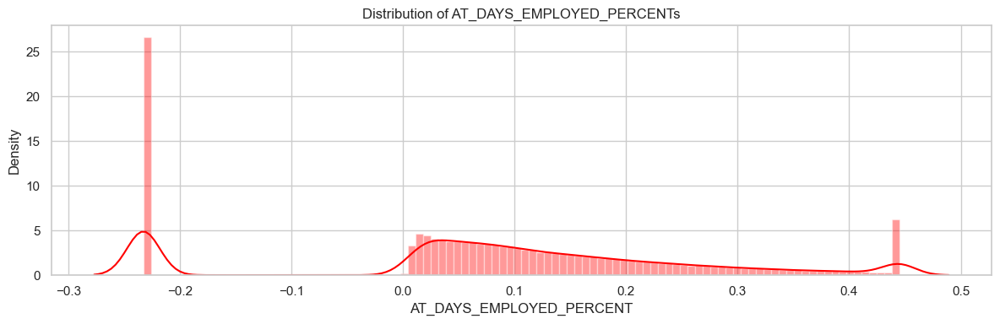


Normal Distribution Check: 

Test Statistic: 0.9226061105728149, P-value: 0.0
Reject the null hypothesis (data may not be normally distributed)



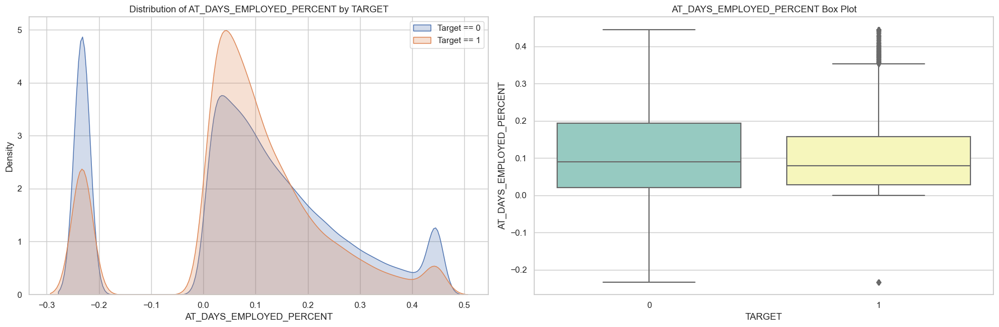

In [96]:
plot_distribution(df,"AT_DAYS_EMPLOYED_PERCENT" ,"red")
normal_distribution_check(df["AT_DAYS_EMPLOYED_PERCENT"])
plot_kde_and_box(df,'AT_DAYS_EMPLOYED_PERCENT')

In [11]:
df.groupby("TARGET").mean().T

TARGET,0,1
AMT_ANNUITY,26835.419909,26367.646949
DAYS_BIRTH,44.214182,40.780351
DAYS_REGISTRATION,13.773227,12.289638
DAYS_ID_PUBLISH,8.266356,7.485204
EXT_SOURCE_2,0.523570,0.411260
EXT_SOURCE_3,0.524188,0.425434
PA_AMT_CREDIT_sum,730676.824508,747088.539605
PA_DAYS_DECISION_max_y,1.092061,1.037057
IP_DAYS_INSTALMENT_min,4.154683,3.703462
IP_AMT_INSTALMENT_sum,546802.545081,503840.033287


In [12]:
df.groupby("TARGET").median().T

TARGET,0,1
AMT_ANNUITY,24876.000000,25263.000000
DAYS_BIRTH,43.498630,39.128767
DAYS_REGISTRATION,12.449315,11.112329
DAYS_ID_PUBLISH,9.027397,7.663014
EXT_SOURCE_2,0.573402,0.441076
EXT_SOURCE_3,0.535276,0.475850
PA_AMT_CREDIT_sum,383503.500000,386527.500000
PA_DAYS_DECISION_max_y,0.769863,0.709589
IP_DAYS_INSTALMENT_min,4.032877,3.098630
IP_AMT_INSTALMENT_sum,302201.145000,252742.185000


## Two-sample Statistical  t-test
    A two-sample t-test is performed when you want to compare the means of two independent groups to determine if there is a statistically significant difference between them. In the context of one numeric and one categorical variable with two categories, the goal is to assess whether the means of the numeric variable are different between the two categories of the categorical variable.

### Objective:
    Determine if there is a statistically significant difference in the means of the numeric variable between the two categories of the categorical variable.


    Null Hypothesis (H0):
    The means of the numeric variable are equal between the two categories.

    Alternative Hypothesis (H1):
    The means of the numeric variable are not equal between the two categories.

### Why Perform a Two-Sample T-Test:
    1.To test whether there is evidence to reject the null hypothesis and conclude that there is a significant difference in the means of the numeric variable between the two categories.

    2.The t-test assesses whether the observed difference in means is statistically significant, taking into account the variability within each group.

### Summary:
    A two-sample t-test helps you assess whether the means of a numeric variable differ significantly between two categories of a categorical variable, providing insights into potential group differences.

In [79]:
print("Two Sample t-test for all the feature :\n")
for feature in df.drop("TARGET",axis=1).columns:
    
    print(feature,":\n")
    group_0 = df[df['TARGET'] == 0][feature]
    group_1 = df[df['TARGET'] == 1][feature]

    t_statistic, p_value = stats.ttest_ind(group_0, group_1,alternative='two-sided')

    print(f'T-statistic: {t_statistic}')
    print(f'P-value: {p_value}')

    alpha = 0.025
    if p_value < alpha:
        print("Reject the null hypothesis: There is a significant difference in means.\n\n")
    else:
        print("Fail to reject the null hypothesis: There is no significant difference in means.\n\n")

Two Sample t-test for all the feature :

AMT_ANNUITY :

T-statistic: 5.320846526733901
P-value: 1.0335752405588428e-07
Reject the null hypothesis: There is a significant difference in means.


DAYS_BIRTH :

T-statistic: 43.51983556101816
P-value: 0.0
Reject the null hypothesis: There is a significant difference in means.


DAYS_REGISTRATION :

T-statistic: 23.3003086366921
P-value: 5.596554201090424e-120
Reject the null hypothesis: There is a significant difference in means.


DAYS_ID_PUBLISH :

T-statistic: 28.572653128496796
P-value: 2.5275238143602898e-179
Reject the null hypothesis: There is a significant difference in means.


EXT_SOURCE_2 :

T-statistic: 90.05350588929981
P-value: 0.0
Reject the null hypothesis: There is a significant difference in means.


EXT_SOURCE_3 :

T-statistic: 87.10705100677774
P-value: 0.0
Reject the null hypothesis: There is a significant difference in means.


PA_AMT_CREDIT_sum :

T-statistic: -3.115855642211741
P-value: 0.0018342890681729625
Reject t

### Inference:

    1.The average AMT_ANNUITY is significantly different between the two groups.
    2.The average age (DAYS_BIRTH) is significantly different between the two groups.
    3.The average number of days since registration is significantly different between the two groups.
    4.The average number of days since ID publication is significantly different between the two groups.
    5.The average EXT_SOURCE_2 is significantly different between the two groups.
    6.The average EXT_SOURCE_3 is significantly different between the two groups.
    7.The sum of PA_AMT_CREDIT is significantly different between the two groups.
    8.The maximum of PA_DAYS_DECISION in the last year is significantly different between the two groups.
    9.The minimum of IP_DAYS_INSTALMENT is significantly different between the two groups.
    10.The sum of IP_AMT_INSTALMENT is significantly different between the two groups.
    11.The average of IP_AMT_INSTALMENT is significantly different between the two groups.
    12.The ratio of credit amount to income is significantly different between the two groups.
    13.The ratio of annuity amount to income is significantly different between the two groups.
    14.The credit term is significantly different between the two groups.
    15.There is no significant difference in the ratio of days employed to income between the two groups.
    
### Summary:

    In summary, for most of the features, there is a significant difference in means between the two groups, indicating potential distinctions between the groups for these variables. However, for the feature AT_DAYS_EMPLOYED_PERCENT, there is no significant difference in means. These results provide insights into the characteristics that vary significantly between the two groups in your dataset.

##  Mann-Whitney U Test:

#### Introduction 

    The Mann-Whitney U test is a non-parametric statistical test designed to assess whether there is a significant difference between the distributions of two independent groups. It is particularly useful when the assumptions of the t-test, such as normal distribution of data, are not met.

#### Purpose:

    The primary goal of the Mann-Whitney U test is to determine if there is evidence to reject the null hypothesis that the distributions of two groups are identical. It is commonly used in situations where researchers want to compare medians or central tendencies of two groups without assuming a specific distribution for the data.

#### Assumptions:

    The Mann-Whitney U test has fewer assumptions compared to the t-test. However, it still assumes:

    Independence: Observations within each group must be independent.
    Ordinal Data: The data should be at least ordinal, meaning you can rank the observations in each group.
    
#### Interpretation:

    Null Hypothesis (H0):

    The distributions of the two groups are identical.
    
    Alternative Hypothesis (H1):

    The distributions of the two groups are not identical.
##### Decision:

    If the p-value is less than the chosen significance level (commonly 0.05), reject the null hypothesis, indicating a   significant difference in distributions.

In [85]:
print("Two Sample Mann-Whitney test for all the feature :\n")
for feature in df.drop("TARGET",axis=1).columns:
    
    print(feature,":\n")
    group_0 = df[df['TARGET'] == 0][feature]
    group_1 = df[df['TARGET'] == 1][feature]

    statistic, p_value = stats.mannwhitneyu(group_0, group_1, alternative='two-sided')

    print(f'Mann-Whitney U Statistic: {t_statistic}')
    print(f'P-value: {p_value}')

    alpha = 0.025
    if p_value < alpha:
        print("Reject the null hypothesis: There is a significant difference in means.\n\n")
    else:
        print("Fail to reject the null hypothesis: There is no significant difference in means.\n\n")

Two Sample Mann-Whitney test for all the feature :

AMT_ANNUITY :

Mann-Whitney U Statistic: 0.8005022581812616
P-value: 0.9778701022608962
Fail to reject the null hypothesis: There is no significant difference in means.


DAYS_BIRTH :

Mann-Whitney U Statistic: 0.8005022581812616
P-value: 0.0
Reject the null hypothesis: There is a significant difference in means.


DAYS_REGISTRATION :

Mann-Whitney U Statistic: 0.8005022581812616
P-value: 6.303924575650132e-110
Reject the null hypothesis: There is a significant difference in means.


DAYS_ID_PUBLISH :

Mann-Whitney U Statistic: 0.8005022581812616
P-value: 1.3917745563748238e-186
Reject the null hypothesis: There is a significant difference in means.


EXT_SOURCE_2 :

Mann-Whitney U Statistic: 0.8005022581812616
P-value: 0.0
Reject the null hypothesis: There is a significant difference in means.


EXT_SOURCE_3 :

Mann-Whitney U Statistic: 0.8005022581812616
P-value: 0.0
Reject the null hypothesis: There is a significant difference in m

### Inference:

    1.There is no significant difference in the distribution of AMT_ANNUITY between the two groups.
    2.There is a significant difference in the distribution of DAYS_BIRTH between the two groups.
    3.There is a significant difference in the distribution of DAYS_REGISTRATION between the two groups.
    4.There is a significant difference in the distribution of DAYS_ID_PUBLISH between the two groups.
    5.There is a significant difference in the distribution of EXT_SOURCE_2 between the two groups.
    6.There is a significant difference in the distribution of EXT_SOURCE_3 between the two groups.
    7.There is no significant difference in the distribution of PA_AMT_CREDIT_sum between the two groups.
    8.There is a significant difference in the distribution of PA_DAYS_DECISION_max_y between the two groups.
    9.There is a significant difference in the distribution of IP_DAYS_INSTALMENT_min between the two groups.
    10.There is a significant difference in the distribution of IP_AMT_INSTALMENT_sum between the two groups.
    11.There is a significant difference in the distribution of IP_AMT_INSTALMENT_avg between the two groups.
    12.There is no significant difference in the distribution of AT_CREDIT_INCOME_PERCENT between the two groups.
    13.There is a significant difference in the distribution of AT_ANNUITY_INCOME_PERCENT between the two groups.
    14.There is a significant difference in the distribution of AT_CREDIT_TERM between the two groups.
    15.There is a significant difference in the distribution of AT_DAYS_EMPLOYED_PERCENT between the two groups.
    
### Summary:

    In summary, for most of the features, there is a significant difference in means between the two groups, indicating potential distinctions between the groups for these variables. However, for the feature AMT_ANNUITY, PA_AMT_CREDIT_sum, AT_CREDIT_INCOME_PERCENT, there is no significant difference in means. These results provide insights into the characteristics that vary significantly between the two groups in our dataset.

## Bi-Variate Analysis

In [197]:
col = df.drop("TARGET",axis=1).columns
scaler = StandardScaler(copy=True,with_mean=True, with_std=True)
    
scaler.fit(df.drop("TARGET",axis=1))
    
Scaled_data = scaler.transform(df.drop("TARGET",axis=1))
df_scaled = pd.DataFrame(Scaled_data, columns = col)
df_scaled.head()


df_scaled=pd.concat([df_scaled,df["TARGET"]],axis=1)
df_scaled

def bi_variate2(data, feature1):
    features_to_plot = data.drop([feature1, "TARGET"], axis=1).columns
    num_features = len(features_to_plot)

    # Calculate the number of rows and columns for subplots
    num_rows = (num_features - 1) // 3 + 1
    num_cols = min(num_features, 3)

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    axes = axes.flatten()

    for i, feature2 in enumerate(features_to_plot):
        # Scatter plot with adjustments for imbalanced data
        sns.scatterplot(
            x=feature1, y=feature2, hue='TARGET', data=data, palette='Set1',
            s=data['TARGET'].apply(lambda x: 50 if x == 1 else 10),  # Adjust marker size
            alpha=0.7,  # Set transparency
            ax=axes[i]  # Use the current subplot
        )

        # Customize the plot
        axes[i].set_title(f"Scatter Plot: {feature1} vs {feature2}")
        axes[i].set_xlabel(feature1)
        axes[i].set_ylabel(feature2)
        axes[i].legend(title='TARGET', loc='upper right')

    # Adjust layout
    plt.tight_layout()
    plt.show()
    

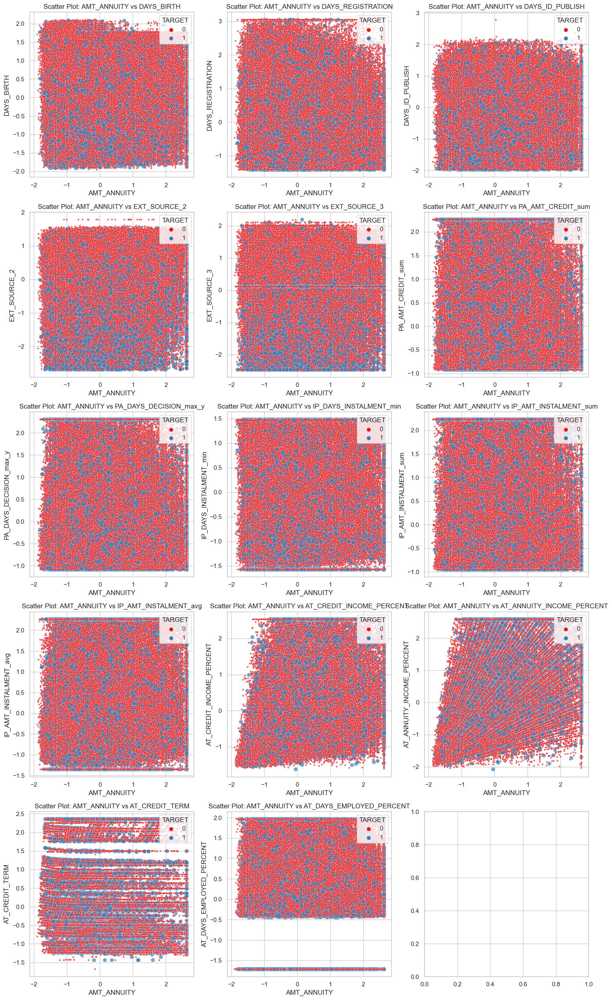

In [198]:
bi_variate2(df_scaled,"AMT_ANNUITY")

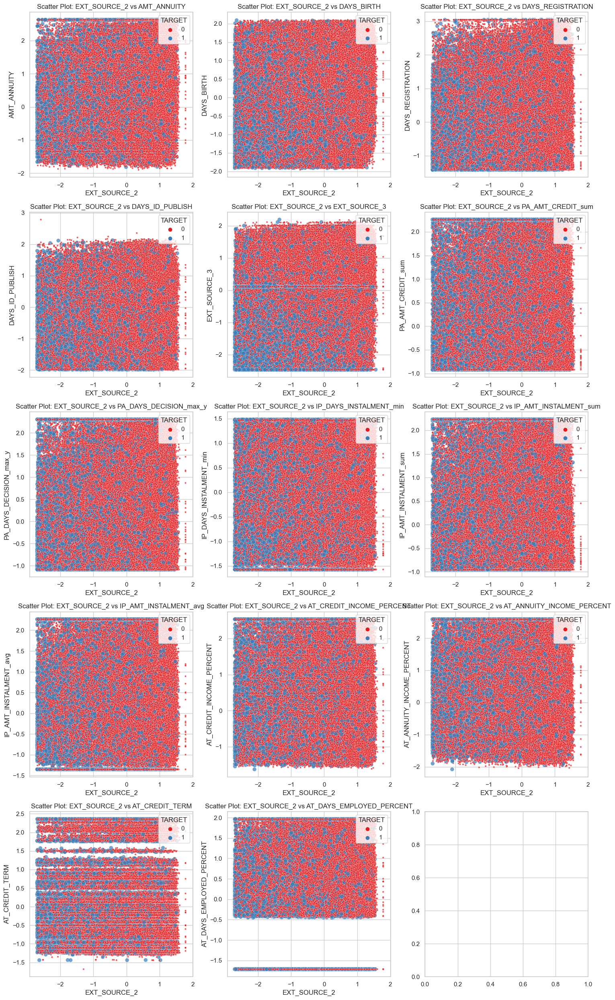

In [200]:
bi_variate2(df_scaled,"EXT_SOURCE_2")

In [202]:
!pip install imblearn

  Using cached imblearn-0.0-py2.py3-none-any.whl (1.9 kB)


In [204]:
!pip3 uninstall imblearn --yes


Found existing installation: imblearn 0.0
Uninstalling imblearn-0.0:
  Successfully uninstalled imblearn-0.0
